In [1]:
# Import libraries
import glob
import numpy as np
import matplotlib.pyplot as plt
import corner
from IPython.display import display, Math

In [2]:
alllabels=[['r','$\lambda_t$','$\\tau_s$','$\lambda_d$','$\\tau_d$','$\lambda_{td}$','$\lambda_{di}$'],
           ['r','$\lambda_t$','$\\tau_s$','$\lambda_d$','$\\tau_d$','$\lambda_{td}$','$\lambda_{di}$','K'],
           ['r','$\lambda_t$','$\\tau_s$','$\\tau_d$','$\lambda_{td}$','$\lambda_{di}$'],
           ['r','$\lambda_t$','$\\tau_s$','$\\tau_d$','$\lambda_{td}$','$\lambda_{di}$','K'],
           ['r','$\lambda_t$','$\\tau_s$','$\\tau_d$','$\lambda_{to}$','$\lambda_{di}$','$\lambda_{od}$','$\\tau_o$'],
           ['r','$\lambda_t$','$\\tau_s$','$\\tau_d$','$\lambda_{to}$','$\lambda_{di}$','$\lambda_{od}$','$\\tau_o$','K'],
           ['r','$\lambda_t$','$\\tau_s$','$\\tau_d$','$\lambda_{odt}$','$\lambda_{di}$','$\lambda_{o}$','$\\tau_o$'],
           ['r','$\lambda_t$','$\\tau_s$','$\\tau_d$','$\lambda_{odt}$','$\lambda_{di}$','$\lambda_{o}$','$\\tau_o$','K'],
           ['r','$\lambda_ot$','$\\tau_s$','$\\tau_d$','$\lambda_{odt}$','$\lambda_{di}$','$\lambda_{o}$','$\\tau_o$'],
           ['r','$\lambda_ot$','$\\tau_s$','$\\tau_d$','$\lambda_{odt}$','$\lambda_{di}$','$\lambda_{o}$','$\\tau_o$','K']]

Model 3


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 1


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 2


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 7


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 6


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 9


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 5


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 8


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 4


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Model 0


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

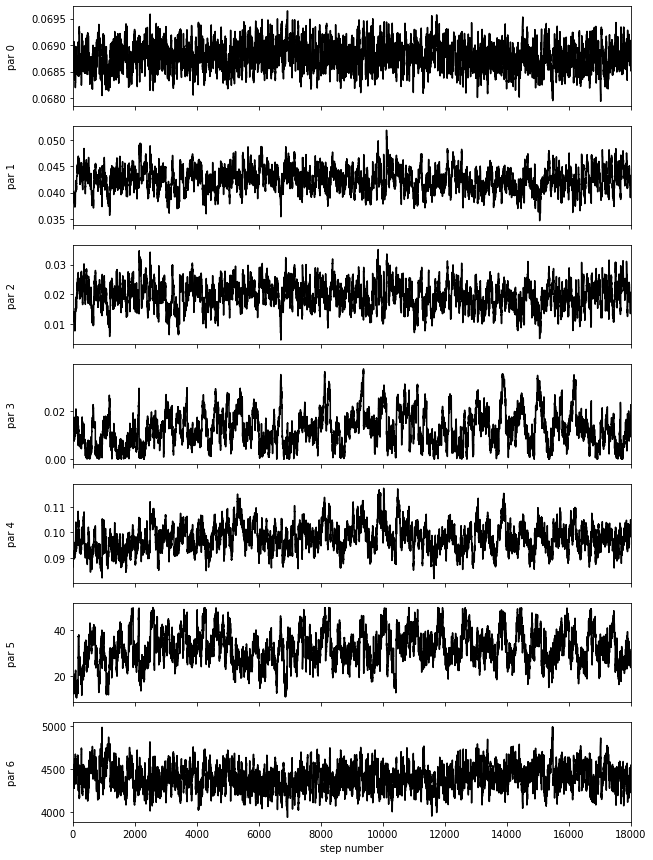

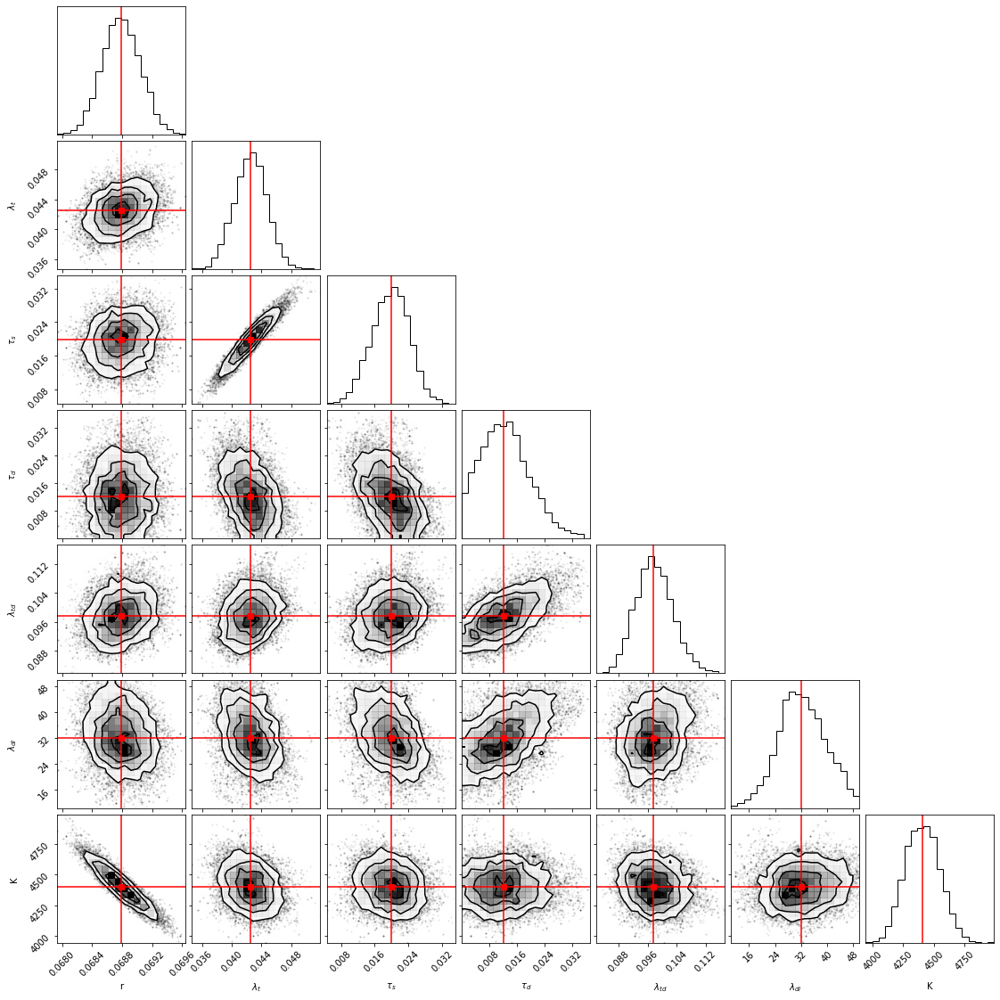

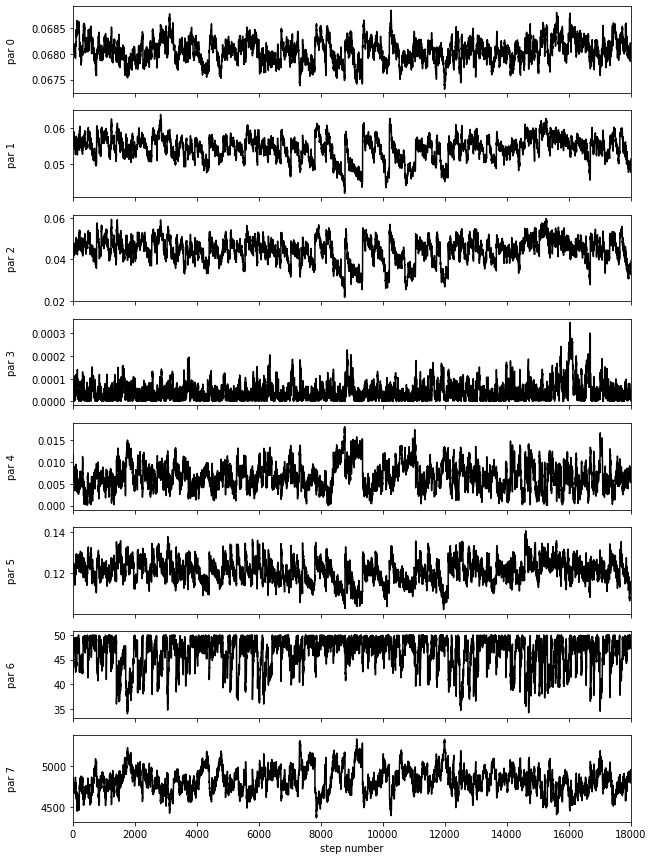

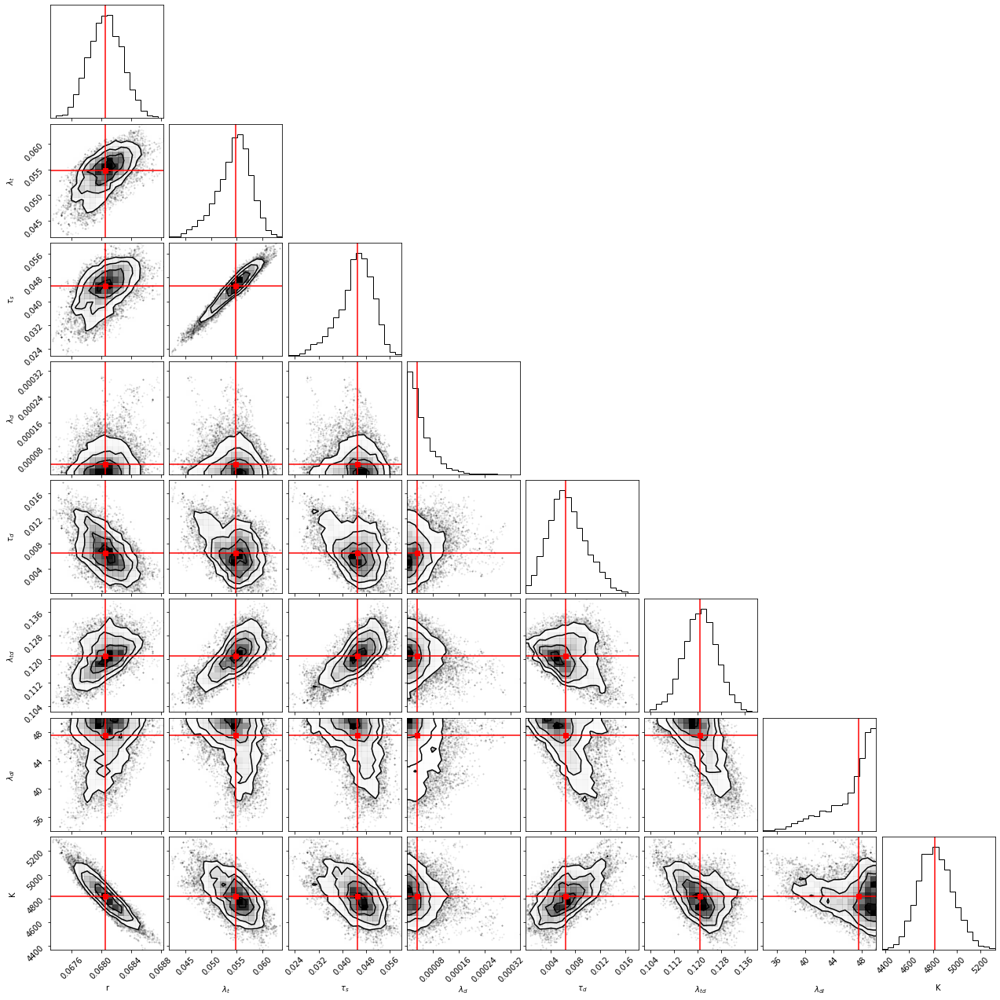

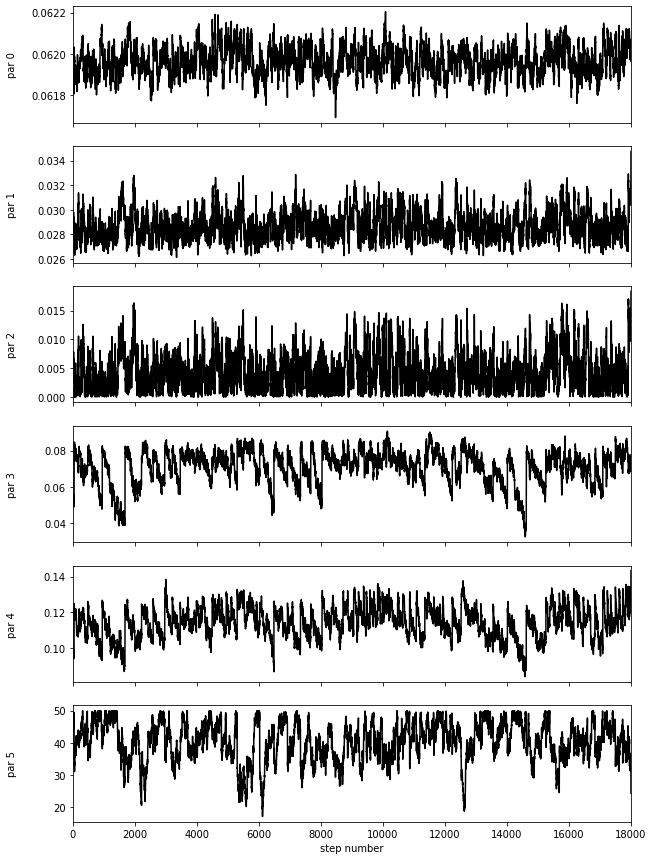

...

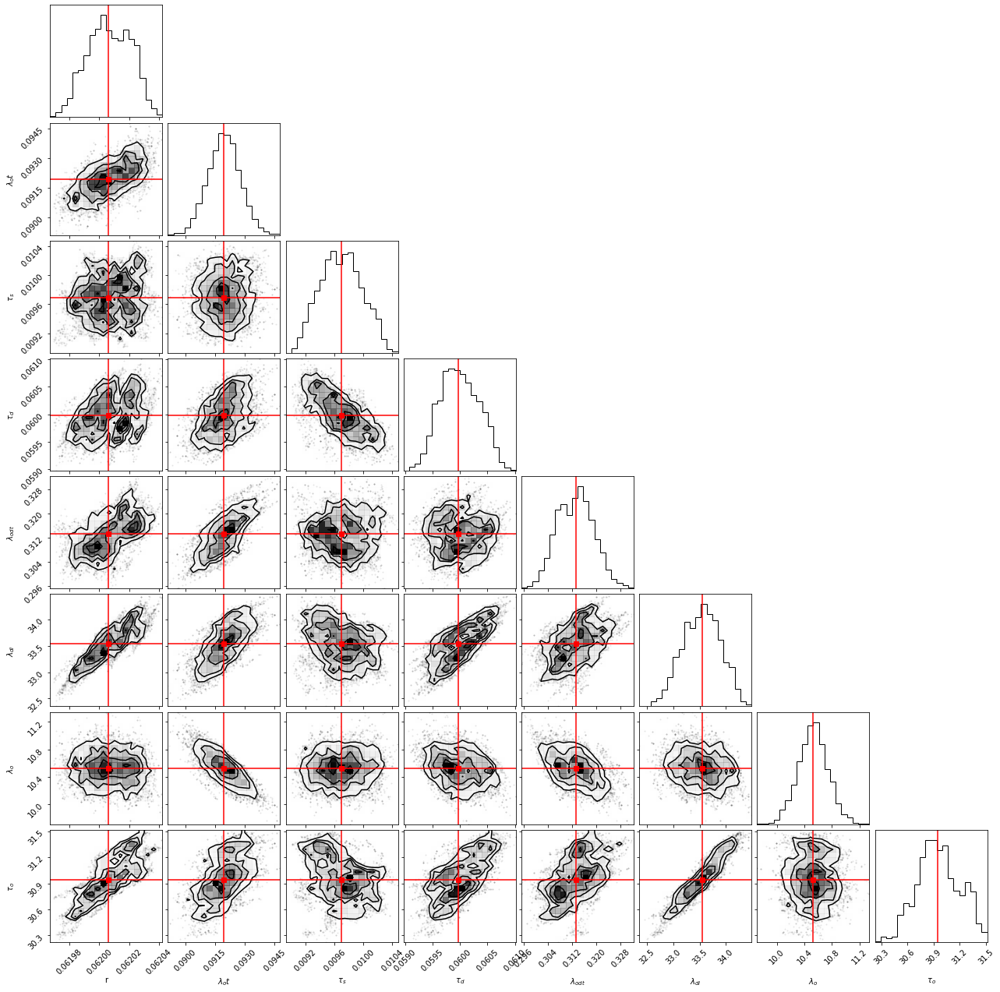

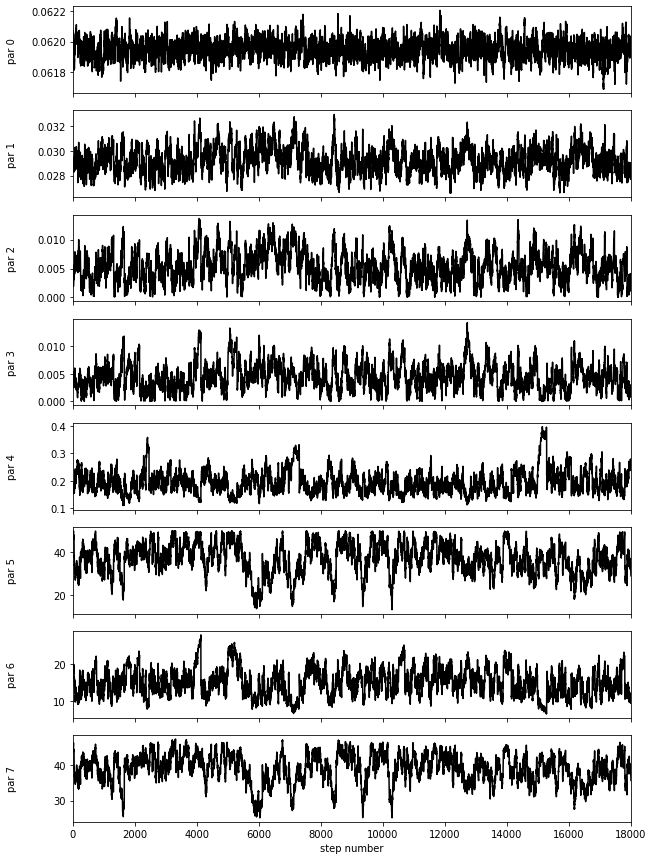

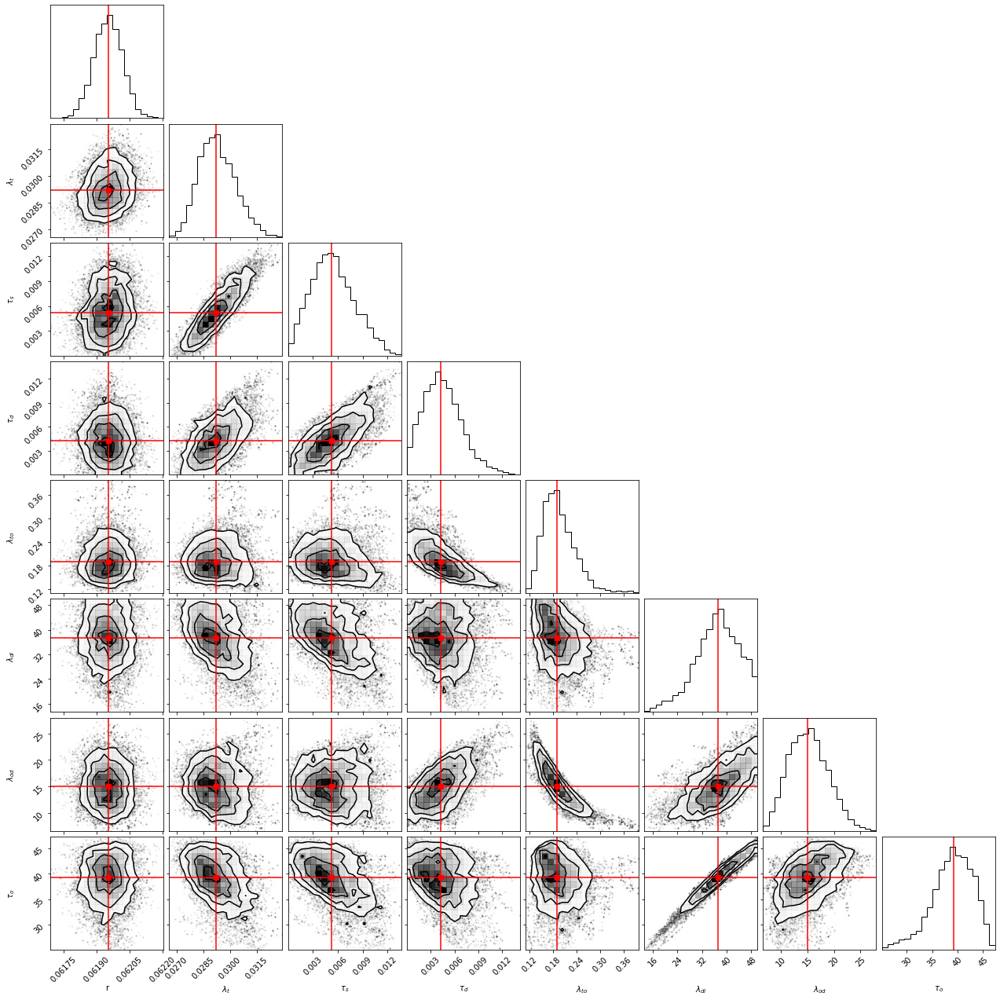

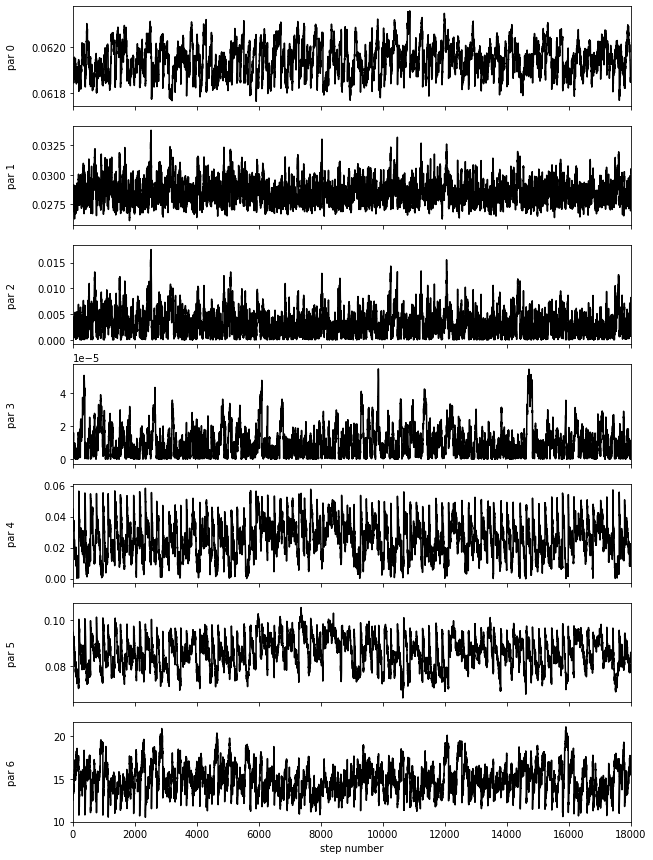

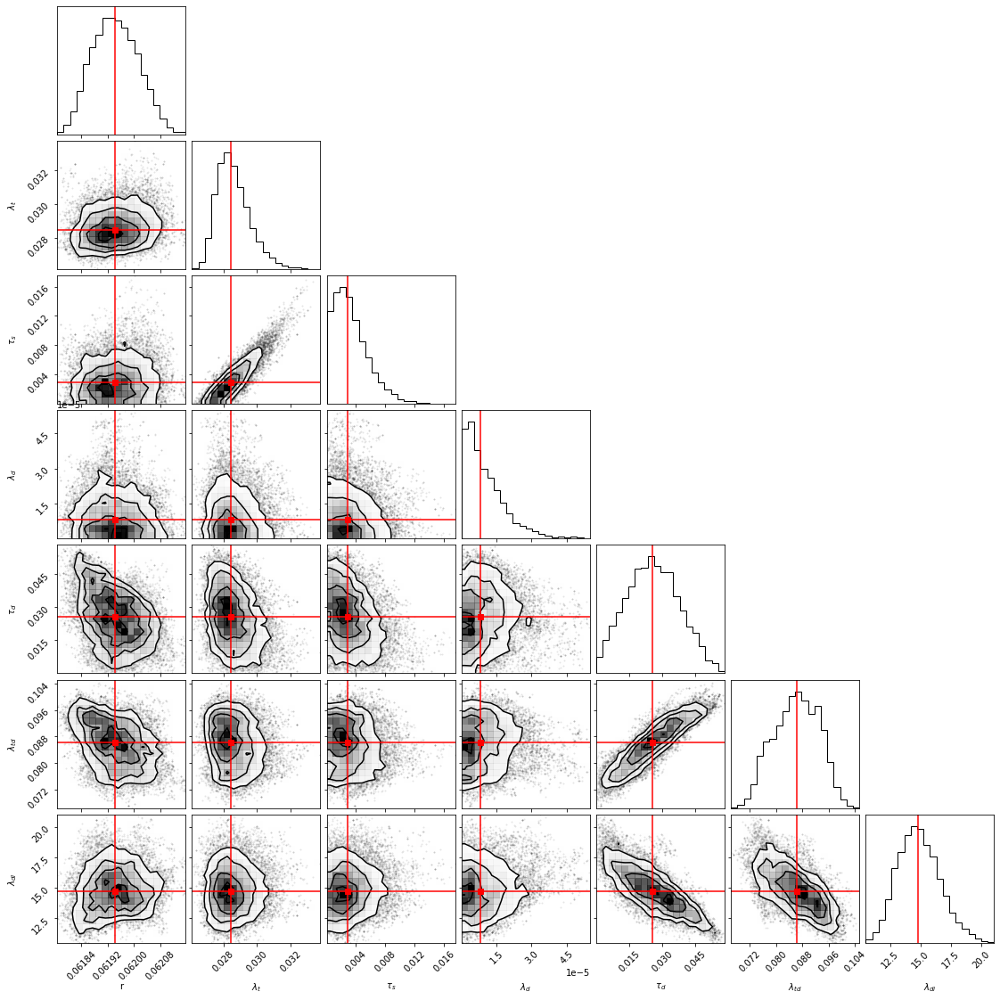

In [3]:
FilenamesList = glob.glob('./All_dataOutput/likelihood_m*.dat')
for file in FilenamesList:
    model= file.replace('./All_dataOutput/likelihood_m','').replace('.dat','')
    print ('Model',model)
    queso = np.loadtxt('./All_dataOutput/lastchain_m' + model + '.dat')
    like = np.loadtxt(file)
    if int(model) == 8:
        flat_like = like[9000:16000]
        flat_queso = queso[9000:16000]
    else:
        flat_like = like[2000:]
        flat_queso = queso[2000:]
    ndim = len(flat_queso[0])
    for i in range(ndim):
        mcmc = np.percentile(flat_queso[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.2e}_{{-{1:.2e}}}^{{{2:.2e}}}"
        txt = txt.format(mcmc[1], q[0], q[1], alllabels[int(model)][i])
        display(Math(txt))
    fig, axes = plt.subplots(ndim, figsize=(10, 15), sharex=True)
    for i in range(ndim):
        ax = axes[i]
        ax.plot(flat_queso[:,i], "k")
        ax.set_xlim(0, len(flat_queso))
        ax.set_ylabel('par ' + str(i))
        ax.yaxis.set_label_coords(-0.1, 0.5)
    axes[-1].set_xlabel("step number");
    plt.savefig('chains_m' + model + ".pdf")
    pos_max = np.where(flat_like == max(flat_like))
    value2 = np.median(flat_queso, axis=0)
    fig = corner.corner(flat_queso, labels=alllabels[int(model)]);
    axes = np.array(fig.axes).reshape((ndim, ndim))
    for i in range(ndim):
        ax = axes[i, i]
        ax.axvline(value2[i], color="r")
        #ax.axvline(flat_queso[pos_max[0][0],i], color="c")
    for yi in range(ndim):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(value2[xi], color="r")
            #ax.axvline(flat_queso[pos_max[0][0],xi], color="c")
            ax.axhline(value2[yi], color="r")
            #ax.axhline(flat_queso[pos_max[0][0],yi], color="c")
            ax.plot(value2[xi], value2[yi], "sr")
            #ax.plot(flat_queso[pos_max[0][0],xi], flat_queso[pos_max[0][0],yi], "sc")
    #fig.suptitle('Model ' + model, fontsize=16)
    plt.savefig('corner_m' + model + ".pdf")

In [4]:
my_bic = open('./All_dataOutput/bic.dat','w')
FilenamesList = glob.glob('./All_dataOutput/likelihood_m*.dat')
for model in range(0,10):
    #model= file.replace('./All_dataOutput/likelihood_m','').replace('.dat','')
    #print ('Model',model)
    queso = np.loadtxt('./All_dataOutput/lastchain_m' + str(model) + '.dat')
    like = np.loadtxt('./All_dataOutput/likelihood_m' + str(model) + '.dat')
    if int(model) == 8:
        flat_like = like[9000:16000]
        flat_queso = queso[9000:16000]
    else:
        flat_like = like[2000:]
        flat_queso = queso[2000:]
    ndim = len(flat_queso[0])
    maxlog=max(flat_like)
    n=114
    my_bic.write("{:.2f}\n".format(-2*maxlog+ndim*np.log(n)))
    print('Model',model,'= BIC =',"{:.2f}".format(-2*maxlog+ndim*np.log(n)))
    inds = np.random.randint(len(flat_queso), size=100)
    my_file = open('./All_dataOutput/samples_m' + str(model) + '.dat','w')
    for ind in inds:
        sample = flat_queso[ind]
        my_file.write(str(sample).replace('[','').replace('\n','').replace(']','\n'))
    my_file.close()
my_bic.close()

Model 0 = BIC = 6517.43
Model 1 = BIC = 5700.67
Model 2 = BIC = 6522.92
Model 3 = BIC = 5662.31
Model 4 = BIC = 6521.73
Model 5 = BIC = 5683.27
Model 6 = BIC = 6548.77
Model 7 = BIC = 5819.73
Model 8 = BIC = 6554.31
Model 9 = BIC = 5697.71


In [21]:
FilenamesList = glob.glob('./All_dataOutput/likelihood_m*.dat')
file = FilenamesList[0]
model= file.replace('./All_dataOutput/likelihood_m','').replace('.dat','')
print ('Model',model)
queso = np.loadtxt('./All_dataOutput/lastchain_m' + model + '.dat')
like = np.loadtxt(file)
if int(model) == 8:
    flat_like = like[9000:16000]
    flat_queso = queso[9000:16000]
else:
    flat_like = like[2000:]
    flat_queso = queso[2000:]
ndim = len(flat_queso[0])
for i in range(ndim):
    mcmc = np.percentile(flat_queso[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{2}}} = {0:.2e}\pm {{{1:.2e}}}"
    txt = txt.format(np.median(flat_queso[:, i]), np.std(flat_queso[:, i]), alllabels[int(model)][i])
    #display(Math(txt))
    print(txt)

Model 3
\mathrm{r} = 6.88e-02\pm {2.49e-04}
\mathrm{$\lambda_t$} = 4.25e-02\pm {2.18e-03}
\mathrm{$\tau_s$} = 1.99e-02\pm {4.43e-03}
\mathrm{$\tau_d$} = 1.22e-02\pm {6.97e-03}
\mathrm{$\lambda_{td}$} = 9.76e-02\pm {5.14e-03}
\mathrm{$\lambda_{di}$} = 3.21e+01\pm {7.25e+00}
\mathrm{K} = 4.40e+03\pm {1.40e+02}


In [14]:
np.std(flat_queso[:, i])

140.3303722143585